Run the following block first. All other blocks are independent.

In [1]:
import sys
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import pylab
import os
from PIL import Image
from math import e
import astropy.io.fits as pf
from astropy.io import fits

The first test: Fourier transform of a Gaussian, and the inverse Fourier transform

([], <a list of 0 Text yticklabel objects>)

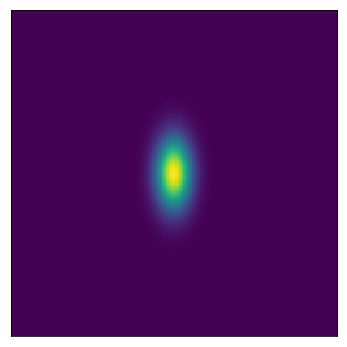

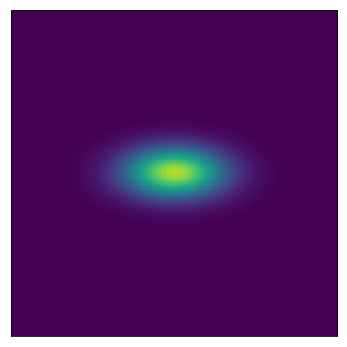

In [2]:
x, y = np.meshgrid(np.linspace(-1,1,1000), np.linspace(-1,1,1000))
d = np.sqrt(4*x*x+y*y)
sigma, mu = 0.03, 0.0
this = np.exp(-( (d-mu)**2 / ( 2.0 * sigma**2 ) ) )

that = np.fft.fft2(this)
fshift = np.fft.fftshift(that)
invshift = np.fft.ifft2(that)

#f = plt.figure(figsize=(20,20))
#plt.subplot(131)
#plt.imshow(this)
#plt.xlim(400,600), plt.ylim(400,600)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(132)
#plt.imshow(abs(fshift),vmin=0,vmax=1400)
#plt.xlim(400,600), plt.ylim(400,600)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(133)
#plt.imshow(abs(invshift))
#plt.show()
#f.savefig('gaussian_FT.pdf', bbox_inches='tight')

f1 = plt.figure(figsize=(6,6))
plt.imshow(this)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f1.savefig('ellipical_Gaussian_1.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(fshift),vmin=0,vmax=800)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f2.savefig('ellipical_Gaussian_2.pdf',transparent=True)

The second test: a disk in the image Fourier transformed and then back again.

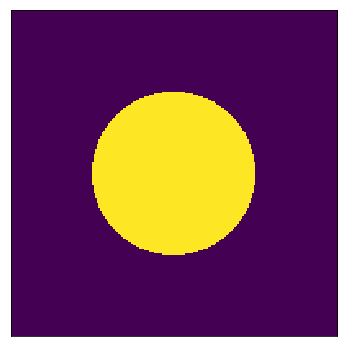

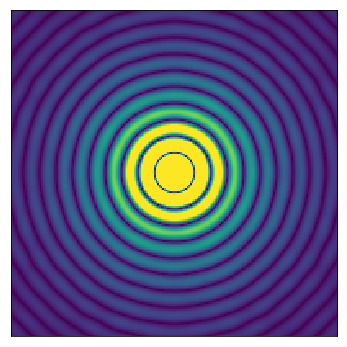

In [3]:
x, y = np.meshgrid(np.linspace(-1,1,1000), np.linspace(-1,1,1000))
d = np.sqrt(x*x+y*y)
disk = np.zeros(x.shape) 
radius = 0.1
w = np.where(d < radius)
disk[w] = 15

disk_FFT = np.fft.fft2(disk)
disk_FFT_shift = np.fft.fftshift(disk_FFT)
disk_IFFT = np.fft.ifft2(disk_FFT_shift)

#f = plt.figure(figsize=(20,20))
#plt.subplot(131)
#plt.imshow(disk)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(132)
#plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=6000)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(133), plt.imshow(abs(disk_IFFT))
#plt.show()
#f.savefig('ellipse_FT.pdf', bbox_inches='tight')

f1 = plt.figure(figsize=(6,6))
plt.imshow(disk)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f1.savefig('Disk_1.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=6000)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f2.savefig('Disk_2.pdf',transparent=True)


The third test: A disk in the image Fourier transformed, with a central circle zeroed in spatial frequency.
    Inverse Fourier transform yields the expected edge of the image, with info missing about the centre.

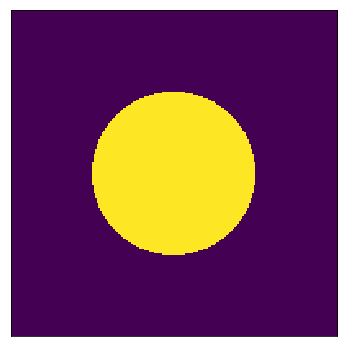

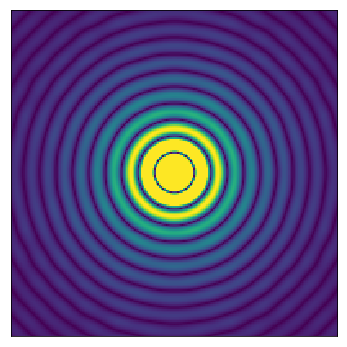

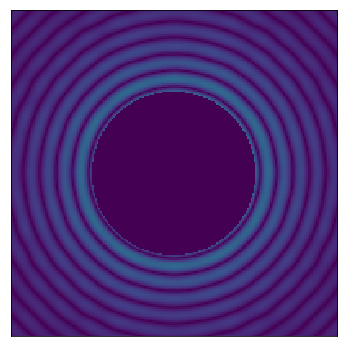

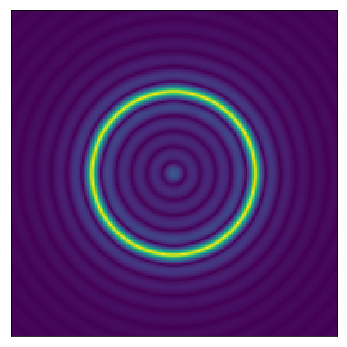

In [4]:
x, y = np.meshgrid(np.linspace(-1,1,1000), np.linspace(-1,1,1000))
d = np.sqrt(1.*x*x+y*y)
d2 = np.sqrt(x*x+1.*y*y)
disk = np.zeros(x.shape) 
radius = 0.1
w = np.where(d < radius)
disk[w] = 10

disk_FFT = np.fft.fft2(disk)
disk_FFT_shift = np.fft.fftshift(disk_FFT)

r2 = 0.1
w2 = np.where(d2 < r2)


#f = plt.figure(figsize=(20,20))
#plt.subplot(141)
#plt.imshow(disk)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])

#plt.subplot(142)
#plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])

#plt.subplot(143)
#plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])

#plt.subplot(144)
#plt.imshow(abs(disk_IFFT),vmin=0,vmax=5)
#plt.xlim(300,700)
#plt.ylim(300,700)
#plt.xticks([])
#plt.yticks([])

#plt.show()
#f.savefig('disk_FT_low_freq.pdf', bbox_inches='tight')

f1 = plt.figure(figsize=(6,6))
plt.imshow(disk)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f1.savefig('filtering_disk_image.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f2.savefig('filtering_disk_FT.pdf',transparent=True)

disk_FFT_shift[w2]=0
disk_IFFT = np.fft.ifft2(disk_FFT_shift)

f3 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f3.savefig('filtering_disk_highfreq_mask.pdf',transparent=True)

f4 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_IFFT),vmin=0,vmax=5)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
f4.savefig('filtering_disk_highfreq_image.pdf',transparent=True)


The 4th test: a checkboard pattern.

In [5]:
checker = Image.open("checker.jpg")
checker_arr = np.array(checker)
print checker_arr.shape

checker_bw = checker_arr[:,:]

checker_FFT = np.fft.fft2(checker_bw)
checker_FFT_shift = np.fft.fftshift(checker_FFT)

xs, ys = np.meshgrid(np.linspace(-1,1,300), np.linspace(-1,1,300))
ds = np.sqrt(xs*xs+ys*ys)
r2 = 0.5
w2 = np.where(ds < r2)
checker_FFT_shift[w2]=0

checker_IFFT = np.fft.ifft2(checker_FFT_shift)

f = plt.figure(figsize=(20,20))
plt.subplot(141), plt.imshow(checker_bw,cmap='gray')
plt.subplot(142), plt.imshow(abs(checker_FFT_shift),vmin=0,vmax=5000,cmap='gray')
plt.subplot(143), plt.imshow(np.angle(checker_FFT_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(144), plt.imshow(abs(checker_IFFT),cmap='gray')
plt.show()

f.savefig('checker_high_freq.pdf', bbox_inches='tight')

SyntaxError: Missing parentheses in call to 'print'. Did you mean print(checker_arr.shape)? (<ipython-input-5-090b17b08ffd>, line 3)

Now the fun part: an actual image is Fourier transformed and back.

(533, 400, 3)


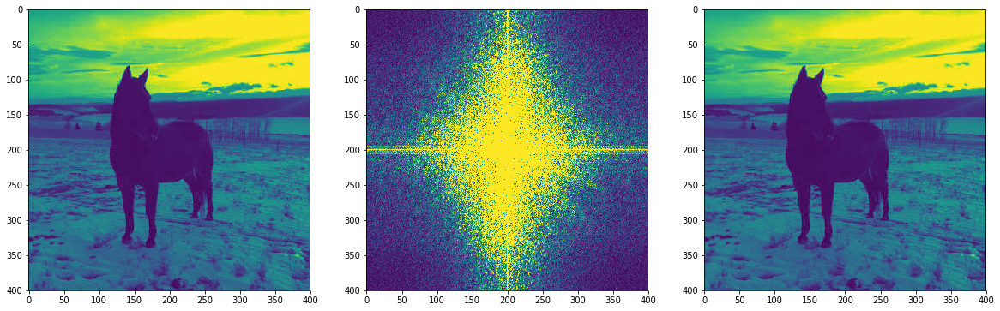

In [194]:
sorento = Image.open("Sorento.jpg")
sorento_arr = np.array(sorento)
print sorento_arr.shape

sorento_bw = sorento_arr[50:450,:,0]

sorento_FFT = np.fft.fft2(sorento_bw)
sorento_FFT_shift = np.fft.fftshift(sorento_FFT)
sorento_IFFT = np.fft.ifft2(sorento_FFT_shift)

f = plt.figure(figsize=(20,20))
plt.subplot(131), plt.imshow(sorento_bw)
plt.subplot(132), plt.imshow(abs(sorento_FFT_shift),vmin=0,vmax=5000)
plt.subplot(133), plt.imshow(abs(sorento_IFFT))
plt.show()

Image with DC offset removed. Expected outline of image:

(1264, 1600, 3)


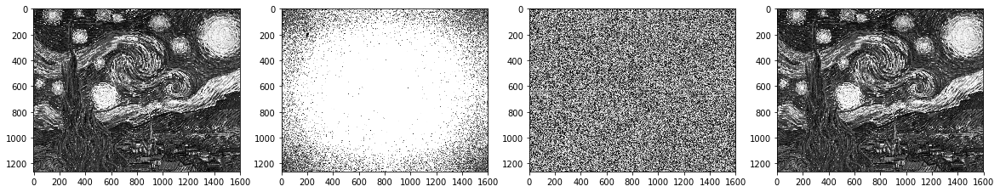

In [3]:
sorento = Image.open("vangogh.jpg")
sorento_arr = np.array(sorento)
print sorento_arr.shape

sorento_bw = sorento_arr[:,:,0]

sorento_FFT = np.fft.fft2(sorento_bw)
sorento_FFT_shift = np.fft.fftshift(sorento_FFT)

xs, ys = np.meshgrid(np.linspace(-1,1,400), np.linspace(-1,1,400))
ds = np.sqrt(xs*xs+ys*ys)
r2 = 0.05
w2 = np.where(ds < r2)
sorento_FFT_shift[w2]=0

sorento_IFFT = np.fft.ifft2(sorento_FFT_shift)

f = plt.figure(figsize=(20,20))
plt.subplot(141), plt.imshow(sorento_bw,cmap='gray')
plt.subplot(142), plt.imshow(abs(sorento_FFT_shift),vmin=0,vmax=5000,cmap='gray')
plt.subplot(143), plt.imshow(np.angle(sorento_FFT_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(144), plt.imshow(abs(sorento_IFFT),cmap='gray')
plt.show()

f.savefig('sorento_high_freq.pdf', bbox_inches='tight')

(533, 400, 3)


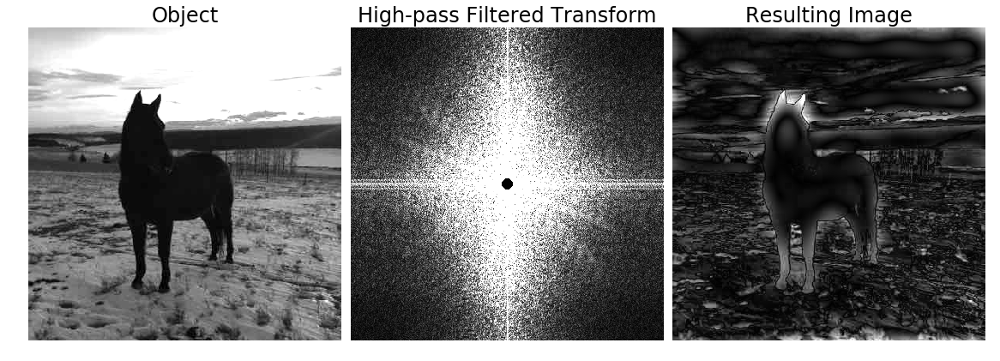

In [6]:
sorento = Image.open("Sorento.jpg")
sorento_arr = np.array(sorento)
print sorento_arr.shape

sorento_bw = sorento_arr[50:450,:,0]

sorento_FFT = np.fft.fft2(sorento_bw)
sorento_FFT_shift = np.fft.fftshift(sorento_FFT)

xs, ys = np.meshgrid(np.linspace(-1,1,400), np.linspace(-1,1,400))
ds = np.sqrt(xs*xs+ys*ys)
r2 = 0.035
w2 = np.where(ds < r2)
sorento_FFT_shift[w2]=0

sorento_IFFT = np.fft.ifft2(sorento_FFT_shift)

fs = 24
f = plt.figure(figsize=(20,12))
plt.subplots_adjust(wspace=0.03)
plt.subplot(131), plt.imshow(sorento_bw,vmin=0,vmax=200,cmap='gray')
plt.axis('off')
plt.title('Object',fontsize=fs)
plt.subplot(132), plt.imshow(abs(sorento_FFT_shift),vmin=0,vmax=5000,cmap='gray')
plt.axis('off')
plt.title('High-pass Filtered Transform',fontsize=fs)
plt.subplot(133), plt.imshow(abs(sorento_IFFT),vmin=0,vmax=130,cmap='gray')
plt.axis('off')
plt.title('Resulting Image',fontsize=fs)
plt.show()

f.savefig('sorento_high_freq1.pdf', bbox_inches='tight')

Image with high spatial frequencies removed. Expected blurry image:

(225, 225, 3)


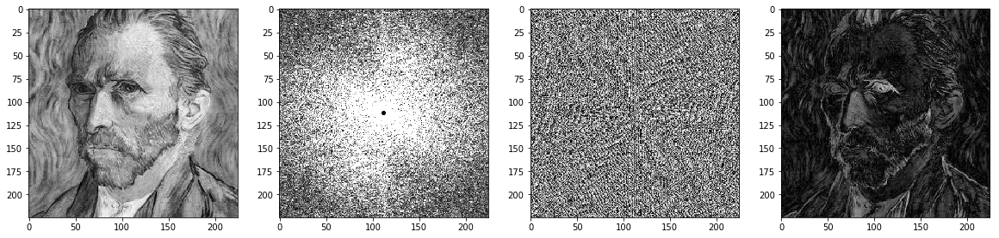

In [22]:
sorento = Image.open("vangogh_self.jpg")
sorento_arr = np.array(sorento)
print sorento_arr.shape

sorento_bw = sorento_arr[:,:,0]

sorento_FFT = np.fft.fft2(sorento_bw)
sorento_FFT_shift = np.fft.fftshift(sorento_FFT)

xs, ys = np.meshgrid(np.linspace(-1,1,225), np.linspace(-1,1,225))
ds = np.sqrt(xs*xs+ys*ys)
r2 = 0.02
w2 = np.where(ds < r2)
sorento_FFT_shift[w2]=0

sorento_IFFT = np.fft.ifft2(sorento_FFT_shift)

f = plt.figure(figsize=(20,20))
plt.subplot(141), plt.imshow(sorento_bw,cmap='gray')
plt.subplot(142), plt.imshow(abs(sorento_FFT_shift),vmin=0,vmax=5000,cmap='gray')
plt.subplot(143), plt.imshow(np.angle(sorento_FFT_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(144), plt.imshow(abs(sorento_IFFT),cmap='gray',vmin=0, vmax=200)
plt.show()

f.savefig('sorento_low_freq.pdf', bbox_inches='tight')

And now plotting the magnitude and phase:

(720, 960, 3)


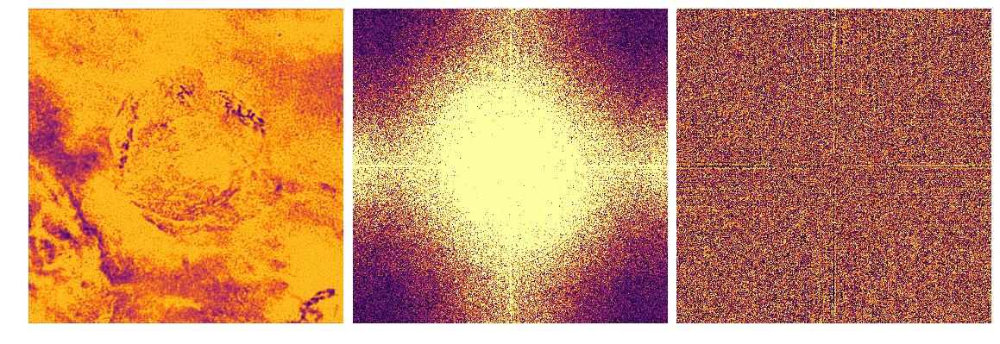

In [38]:
sorento = Image.open("SNR.jpg")
sorento_arr = np.array(sorento)
print sorento_arr.shape

sorento_bw = sorento_arr[:,0:720,0]

sorento_FFT = np.fft.fft2(sorento_bw)
sorento_FFT_shift = np.fft.fftshift(sorento_FFT)
sorento_IFFT = np.fft.ifft2(sorento_FFT_shift)

f = plt.figure(figsize=(20,12))
plt.subplots_adjust(wspace=0.03)
plt.subplot(131), plt.imshow(sorento_bw,vmin=0,vmax=300,cmap='inferno')
plt.axis('off')
plt.subplot(132), plt.imshow(abs(sorento_FFT_shift),vmin=0,vmax=3000,cmap='inferno')
plt.axis('off')
plt.subplot(133), plt.imshow(np.angle(sorento_FFT_shift),vmin=-3.14,vmax=3.14,cmap='inferno')
plt.axis('off')
plt.show()

f.savefig('SNR_FT.jpg', bbox_inches='tight')

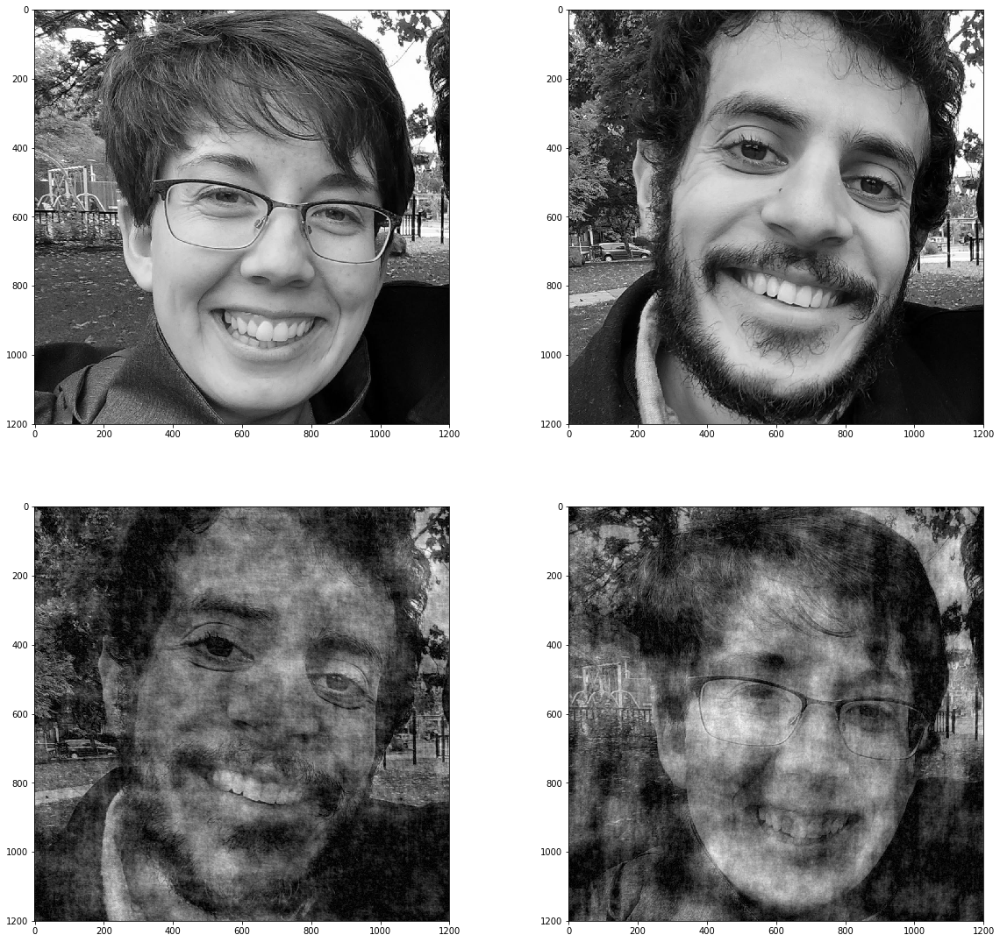

In [279]:
faces = Image.open("A_and_A.jpg")
faces_arr = np.array(faces)

faces_bw = faces_arr[:,:,0]

Face1 = faces_bw[150:1350,20:1220]
Face2 = np.fliplr(faces_bw[80:1280,1100:2300])

Face1_FFT = np.fft.fft2(Face1)
Face1_shift = np.fft.fftshift(Face1_FFT)

Face2_FFT = np.fft.fft2(Face2)
Face2_shift = np.fft.fftshift(Face2_FFT)

Face1_new_FFT = abs(Face1_shift)*e**(np.angle(Face2_shift)*1j)
Face1_new = np.fft.ifft2(Face1_new_FFT)

Face2_new_FFT = abs(Face2_shift)*e**(np.angle(Face1_shift)*1j)
Face2_new = np.fft.ifft2(Face2_new_FFT)

f = plt.figure(figsize=(20,40))
plt.subplot(421), plt.imshow(Face1,cmap='gray')
plt.subplot(422), plt.imshow(Face2,cmap='gray')
#plt.subplot(423), plt.imshow(abs(Face1_shift),vmin=0,vmax=10000,cmap='gray')
#plt.subplot(424), plt.imshow(abs(Face2_shift),vmin=0,vmax=10000,cmap='gray')
#plt.subplot(425), plt.imshow(np.angle(Face1_shift),vmin=-3.14,vmax=3.14,cmap='gray')
#plt.subplot(426), plt.imshow(np.angle(Face2_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(423), plt.imshow(abs(Face1_new),cmap='gray')
plt.subplot(424), plt.imshow(abs(Face2_new),cmap='gray')
plt.show()

f.savefig('A_and_A.pdf', bbox_inches='tight')

(4000, 6000)
(400, 400)
(400, 400)


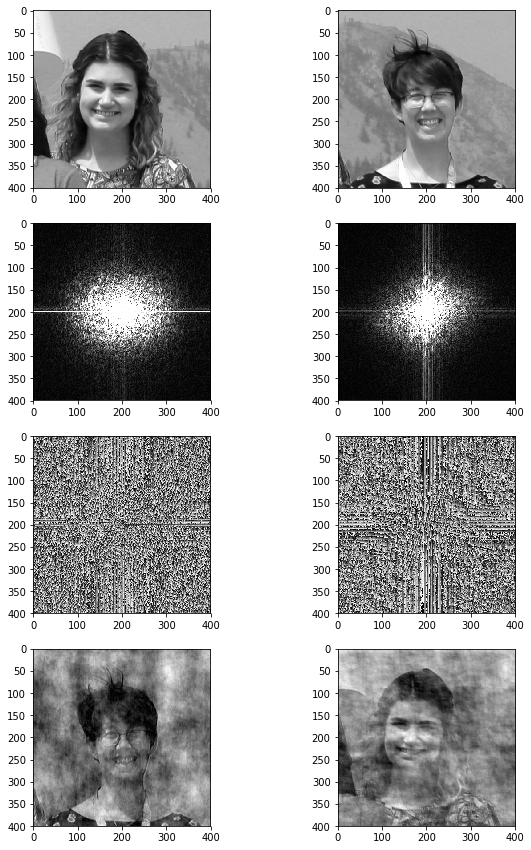

In [3]:
faces_DRAO = Image.open("test2.JPG")
faces_DRAO_arr = np.array(faces_DRAO)

faces_DRAO_bw = faces_DRAO_arr[:,:,0]

print faces_DRAO_bw.shape

Face1 = faces_DRAO_bw[2400:2800,2950:3350]
Face2 = faces_DRAO_bw[2450:2850,3300:3700]

print Face1.shape
print Face2.shape

Face1_FFT = np.fft.fft2(Face1)
Face1_shift = np.fft.fftshift(Face1_FFT)

Face2_FFT = np.fft.fft2(Face2)
Face2_shift = np.fft.fftshift(Face2_FFT)

Face1_new_FFT = abs(Face1_shift)*e**(np.angle(Face2_shift)*1j)
Face1_new = np.fft.ifft2(Face1_new_FFT)

Face2_new_FFT = abs(Face2_shift)*e**(np.angle(Face1_shift)*1j)
Face2_new = np.fft.ifft2(Face2_new_FFT)

f = plt.figure(figsize=(10,15))
plt.subplot(421), plt.imshow(Face1,cmap='gray')
plt.subplot(422), plt.imshow(Face2,cmap='gray')
plt.subplot(423), plt.imshow(abs(Face1_shift),vmin=0,vmax=10000,cmap='gray')
plt.subplot(424), plt.imshow(abs(Face2_shift),vmin=0,vmax=10000,cmap='gray')
plt.subplot(425), plt.imshow(np.angle(Face1_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(426), plt.imshow(np.angle(Face2_shift),vmin=-3.14,vmax=3.14,cmap='gray')
plt.subplot(427), plt.imshow(abs(Face1_new),cmap='gray')
plt.subplot(428), plt.imshow(abs(Face2_new),cmap='gray')
plt.show()

f.savefig('P_and_A.pdf', bbox_inches='tight')

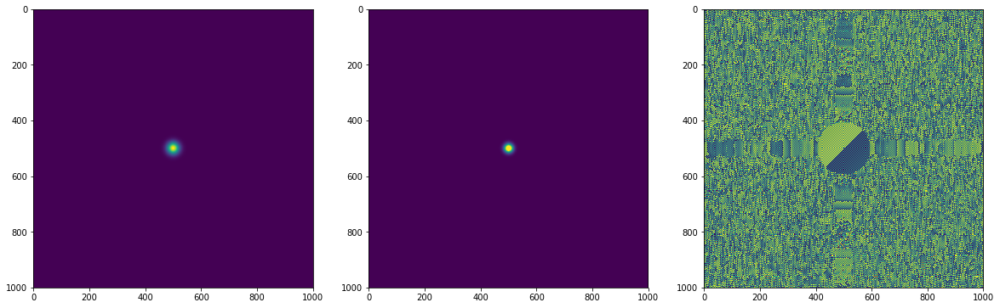

In [6]:
x, y = np.meshgrid(np.linspace(-1,1,1000), np.linspace(-1,1,1000))
d = np.sqrt(x*x+y*y)
sigma, mu = 0.03, 0.0
this = np.exp(-( (d-mu)**2 / ( 2.0 * sigma**2 ) ) )

that = np.fft.fft2(this)
fshift = np.fft.fftshift(that)
invshift = np.fft.ifft2(that)

f = plt.figure(figsize=(20,20))
plt.subplot(131), plt.imshow(this)
plt.subplot(132), plt.imshow(abs(fshift),vmin=0,vmax=1000)
plt.subplot(133), plt.imshow(np.angle(fshift),vmin=-3,vmax=3)
plt.show()
f.savefig('gaussian_FT.pdf', bbox_inches='tight')


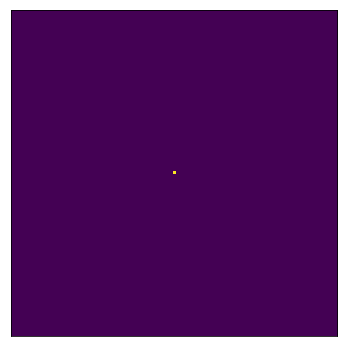

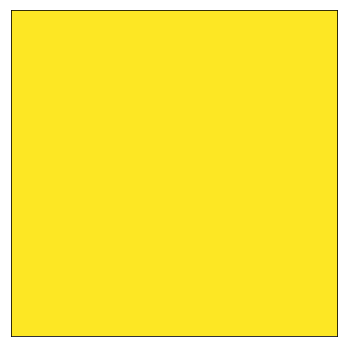

In [85]:
x, y = np.meshgrid(np.linspace(-1,1,1001), np.linspace(-1,1,1001))
this = np.zeros((1001,1001))
this[500,500]=5

that = np.fft.fft2(this)
fshift = np.fft.fftshift(that)
invshift = np.fft.ifft2(that)

#f = plt.figure(figsize=(20,20))
#plt.subplot(131), plt.imshow(this)
#plt.xlim(450,550), plt.ylim(450,550)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(132), plt.imshow(abs(fshift),vmin=0,vmax=5)
#plt.xlim(400,600), plt.ylim(400,600)
#plt.xticks([])
#plt.yticks([])
#plt.subplot(133), plt.imshow(np.angle(fshift),vmin=-4,vmax=4)
#plt.xlim(400,600), plt.ylim(400,600)
#plt.xticks([])
#plt.yticks([])
#plt.show()
#f.savefig('point_FT_off.pdf', bbox_inches='tight')

f1 = plt.figure(figsize=(6,6))
plt.imshow(this)
plt.xlim(450,550), plt.ylim(450,550)
plt.xticks([])
plt.yticks([])
f1.savefig('Point_1.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(fshift),vmin=0,vmax=5)
plt.xlim(450,550), plt.ylim(450,550)
plt.xticks([])
plt.yticks([])
f2.savefig('Point_2.pdf',transparent=True)

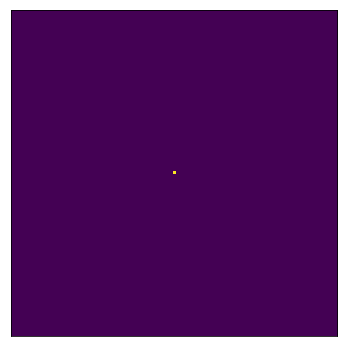

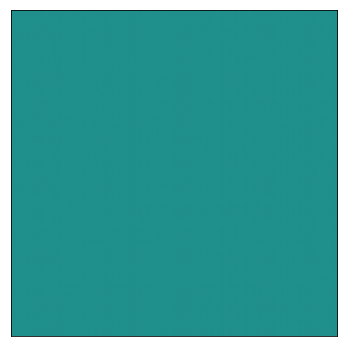

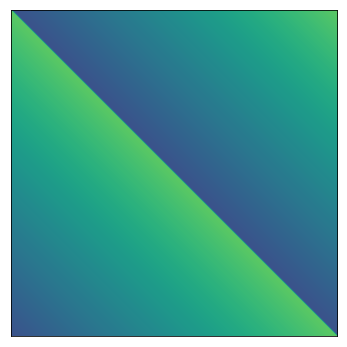

In [86]:
x, y = np.meshgrid(np.linspace(-1,1,2001), np.linspace(-1,1,2001))
this = np.zeros([2001,2001])
this[1000,1000]=1
#d = np.sqrt(x*x+y*y)
#sigma, mu = 0.001, 0.0
#this = 5*np.exp(-( (d-mu)**2 / ( 2.0 * sigma**2 ) ) )

that = np.fft.fft2(this)
fshift = np.fft.fftshift(that)
invshift = np.fft.ifft2(that)

f1 = plt.figure(figsize=(6,6))
plt.imshow(this)
plt.xlim(950,1050), plt.ylim(950,1050)
plt.xticks([])
plt.yticks([])
f1.savefig('Point_image_off.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(fshift),vmin=0,vmax=2,origin='bottom')
#plt.xlim(450,550), plt.ylim(450,550)
plt.xticks([])
plt.yticks([])
f2.savefig('Point_FT_magnitude_off.pdf',transparent=True)

f3 = plt.figure(figsize=(6,6))

ang = np.angle(fshift)
w=np.where(ang<0)
ang2 = ang.copy()
ang2[w] = np.nan
plt.imshow(ang,vmin=-np.pi,vmax=np.pi,interpolation='Gaussian',origin='bottom')
#plt.xlim(995,1005), plt.ylim(995,1005)
plt.xticks([])
plt.yticks([])
f3.savefig('Point_FT_phase_off.pdf',transparent=True)

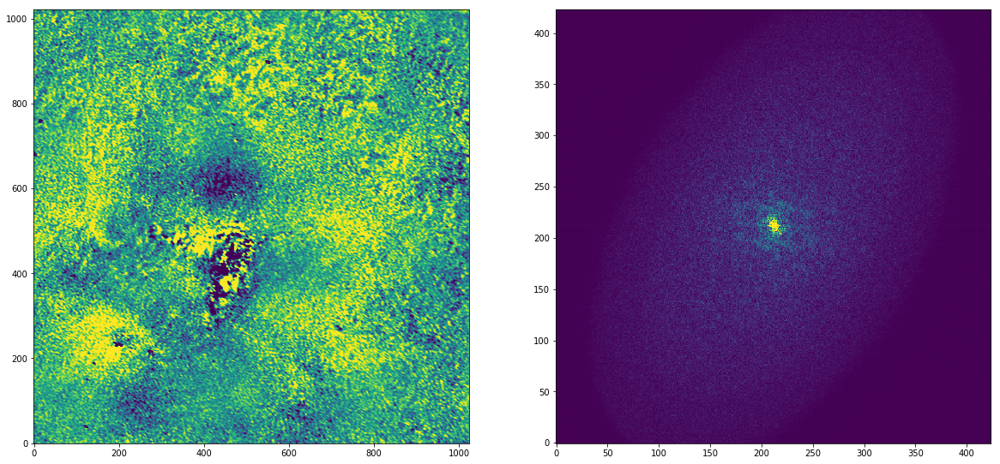

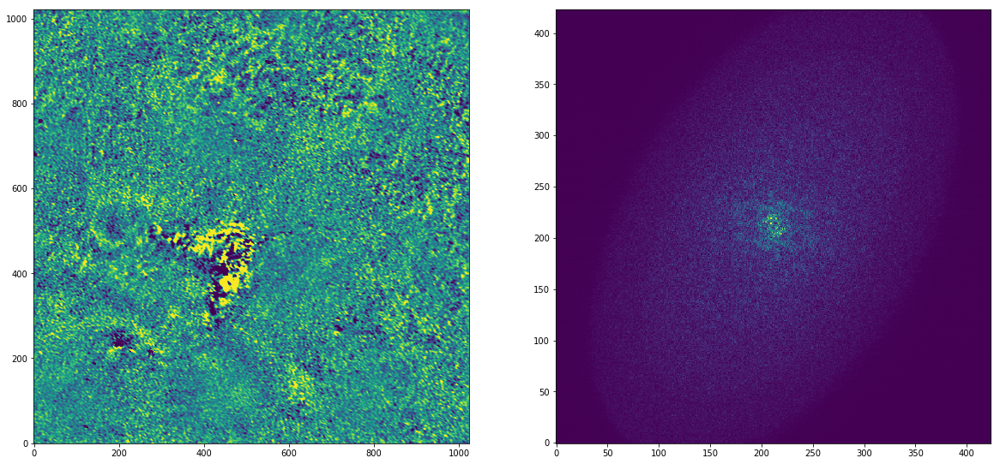

([], <a list of 0 Text yticklabel objects>)

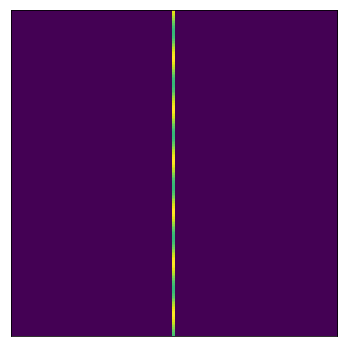

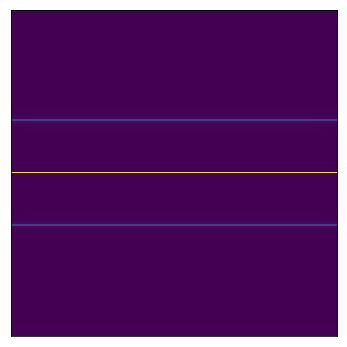

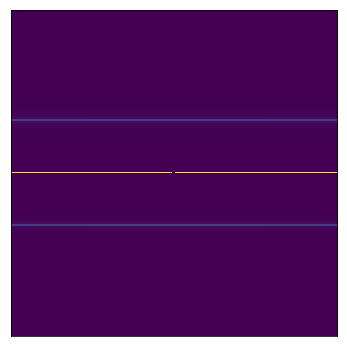

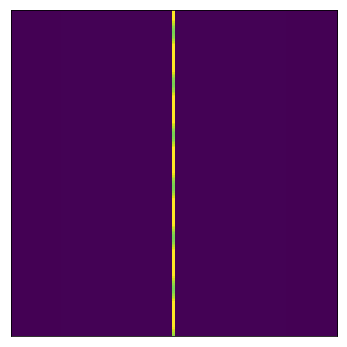

In [20]:
x, y = np.meshgrid(np.linspace(-1,1,1000), np.linspace(-1,1,1000))

disk = np.zeros(x.shape)
disk = np.sin(100*y)+5
width = 0.002
w = np.where(abs(x) > width)
disk[w] = 0

disk_FFT = np.fft.fft2(disk)
disk_FFT_shift = np.fft.fftshift(disk_FFT)


f1 = plt.figure(figsize=(6,6))
plt.imshow(disk)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f1.savefig('filtering_disk_image.pdf',transparent=True)

f2 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f2.savefig('filtering_disk_FT.pdf',transparent=True)

ds = np.sqrt(x*x+y*y)
r2 = 0.002
w2 = np.where(ds < r2)
disk_FFT_shift[w2]=0
disk_IFFT = np.fft.ifft2(disk_FFT_shift)

f3 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_FFT_shift),vmin=0,vmax=5000)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f3.savefig('filtering_disk_highfreq_mask.pdf',transparent=True)

f4 = plt.figure(figsize=(6,6))
plt.imshow(abs(disk_IFFT),vmin=0,vmax=5)
plt.xlim(400,600), plt.ylim(400,600)
plt.xticks([])
plt.yticks([])
#f4.savefig('filtering_disk_highfreq_image.pdf',transparent=True)